In [116]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn
import numpy as np

from scipy.fft import fft, fftfreq
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from sklearn.cluster import OPTICS
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, silhouette_score

In [103]:
class CustomPlotter:

    @staticmethod
    def hist_and_boxplot(df: pd.DataFrame, col: str, ax=None, outlier_drop_pct=0):
        if ax is None:
            fig, (ax_hist, ax_boxplot) = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), gridspec_kw={"height_ratios": (.85, .15), "hspace": 0.3})
        else:
            ax_hist, ax_boxplot = ax
        
        # Remove the top n% of data
        n_pct = int((outlier_drop_pct / 100) * len(df))
        
        df_ = df.sort_values(by=col).reset_index()
        df_ = df_.iloc[n_pct:]
        df_ = df_.iloc[:-n_pct]
        
        # Histogram with a vertical line at the mean value
        sn.histplot(data=df_, x=col, kde=False, ax=ax_hist)
        ax_hist.axvline(df_[col].mean(), color='r', linestyle='--', label=f'Mean: {df_[col].mean():.2f}')
        ax_hist.legend()
        ax_hist.set_title(f'Histogram and Boxplot for {col}')
        ax_hist.set_xlabel('')

        # Horizontal boxplot below the histogram
        sn.boxplot(data=df_, x=col, orient='h', ax=ax_boxplot)
        ax_boxplot.set_xlabel('')
        ax_boxplot.set_yticks([])

    @staticmethod
    def top_barplot_cat(df, col, ax=None, top_n_categories=10):
        if ax is None:
            ax = plt.gca()

        category_counts = df[col].value_counts(ascending=False).iloc[:top_n_categories]  # Select the N most frequent categories
        sn.barplot(x=list(category_counts.index), y=category_counts.values, palette='viridis', ax=ax)
        ax.set_title(f'Barplot for {col} (Top {top_n_categories} Ordered by Frequency)')
        ax.set_xlabel(col)
        ax.set_ylabel('Frequency')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)  # Rotate labels to prevent overlap

    @staticmethod
    def num_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None):
        # Create the scatter plot and regression line in the provided Axes object
        if ax is None:
            ax = plt.gca()

        # Create scatter plot with regression line
        sn.scatterplot(data=df, x=col, y=target, alpha=0.7, ax=ax)
        ax.set_title(f"Scatter plot of {col} vs {target}")

        # Calculate and plot the linear regression line
        no_nan_data = df.dropna()
        X = no_nan_data[col].values.reshape(-1, 1)
        Y = no_nan_data[target].values.reshape(-1, 1)
        model = LinearRegression()
        model.fit(X, Y)
        y_pred = model.predict(X)

        y_min = df[target].min()
        y_max = df[target].max()
        y_range = y_max - y_min

        y_min -= y_range * .02
        y_max += y_range * .02

        ax.set_ylim((y_min, y_max))

        ax.plot(X, y_pred, color="red", linestyle="--", label="Linear regression")
        ax.legend()

    @staticmethod
    def cat_vs_target(df: pd.DataFrame, col: str, target: str, ax: plt.Axes = None, log_attrs=[]):
        # Sort categories by mean value
        category_order = df.groupby(col)[target].median().sort_values(ascending=False).index

        # Create boxplot for categorical columns in the provided Axes object
        if ax is None:
            ax = plt.gca()

        boxplot = sn.boxplot(data=df, x=col, y=target, order=category_order, ax=ax)
        ax.set_title(f"Boxplot of {target} by {col}")

        # Tilt category labels and adjust font size
        num_categories = len(category_order)
        
        if col in log_attrs: ax.set_yscale('log')

        fontsize = 8 if num_categories > 10 else 10
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=fontsize, ha="right")

    @staticmethod
    def combined_plots(df, columns, target, figsize=(14, 8), outlier_drop_pct=0, log_attrs=[]):
        sn.set_style('whitegrid')
        for col in columns:
            if col == target:
                continue
            fig = plt.figure(figsize=figsize)
            fig.suptitle(f'Analysis of {col}', fontsize=16)
            gs = fig.add_gridspec(6, 2)

            ax_target = fig.add_subplot(gs[:, 1])

            if pd.api.types.is_numeric_dtype(df[col]):
                ax_hist = fig.add_subplot(gs[:5, 0])
                ax_box = fig.add_subplot(gs[5, 0])
                CustomPlotter.hist_and_boxplot(df, col, ax=(ax_hist, ax_box), outlier_drop_pct=outlier_drop_pct)
                CustomPlotter.num_vs_target(df, col, target, ax=ax_target)
            else:
                ax_bp = fig.add_subplot(gs[:, 0])
                CustomPlotter.top_barplot_cat(df, col, ax=ax_bp, top_n_categories=10)
                CustomPlotter.cat_vs_target(df, col, target, ax=ax_target, log_attrs=log_attrs)
            
            plt.tight_layout()
            plt.show()
    
    @staticmethod
    def plot_histogram_boxplot(data, title, ax_hist, ax_box):
        sn.histplot(data=data, kde=True, ax=ax_hist)
        ax_hist.axvline(data.mean(), color='red', linestyle='--')
        ax_hist.set_title(title + ' Histogram')
        
        sn.boxplot(x=data, orient='h', ax=ax_box)
        ax_box.set_title(title + ' Boxplot')
        ax_box.set_yticks([])

    @staticmethod
    def find_optimal_period(data, min_period, max_period):
        best_period = None
        min_rss = np.inf

        for period in range(min_period, max_period + 1, 5):
            try:
                decomposition = STL(data, model='additive', period=period)
                residuals = decomposition.resid.dropna()
                rss = np.sum(residuals ** 2)

                if rss < min_rss:
                    min_rss = rss
                    best_period = period
            except ValueError:
                continue

        return best_period

    @staticmethod
    def plot_timeseries_decomposition(data, title, ax):
        min_period = 24 * 6  # 1 day in 10-minute intervals
        max_period = 90 * 24 * 6  # 1 month in 10-minute intervals
        optimal_period = CustomPlotter.find_optimal_period(data, min_period, max_period)

        decomposition = STL(data, model='additive', period=optimal_period)
        trend = decomposition.trend.dropna()
        seasonal = decomposition.seasonal.dropna()
        resid = decomposition.resid.dropna()

        ax[0].plot(data, label='Original')
        ax[0].set_title(title + ' Time Series [%d]' % optimal_period)
        
        ax[1].plot(trend, label='Trend')
        ax[1].set_title(title + ' Trend [%d]' % optimal_period)
        
        ax[2].plot(seasonal, label='Seasonality')
        ax[2].set_title(title + ' Seasonality [%d]' % optimal_period)
        
        ax[3].plot(resid, label='Residuals [%d]' % optimal_period)
        ax[3].set_title(title + ' Residuals')

    @staticmethod
    def plot_fft(data, title, ax):
        N = len(data)
        T = 10 * 60  # 10 minutes in seconds
        yf = fft(data.to_numpy())
        xf = fftfreq(N, T)[:N // 2]

        # Plot the FFT with logarithmic scale and real frequency (in Hz)
        ax.plot(xf, 20 * np.log10(2.0 / N * np.abs(yf[:N // 2])))
        ax.set_title(title + ' Frequency Domain')
        ax.set_xlabel('Frequency (Hz)')
        ax.set_ylabel('Amplitude (dB)')
    
    @staticmethod
    def time_series_analysis(df, attribute):
        if attribute == 'Date Time':
            return

        data = df[attribute].dropna()

        sn.set(style='whitegrid')
        fig = plt.figure(figsize=(16, 12))
        fig.suptitle(f'Analysis of {attribute}', fontsize=16)
        
        # Create subplots with different heights
        gs = fig.add_gridspec(6, 2)
        ax_hist = fig.add_subplot(gs[:3, 0])
        ax_box = fig.add_subplot(gs[3, 0])
        ax_ts = [fig.add_subplot(gs[i, 1]) for i in range(4)]
        ax_fft = fig.add_subplot(gs[4:, :])

        # Call plotting functions
        CustomPlotter.plot_histogram_boxplot(data, attribute, ax_hist, ax_box)
        CustomPlotter.plot_timeseries_decomposition(data, attribute, ax_ts)
        CustomPlotter.plot_fft(data, attribute, ax_fft)
        
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

    @staticmethod
    def plot_autocorrelation(df, attribute):
        data = df[attribute].dropna()
        
        fig, ax = plt.subplots(figsize=(8, 4))
        autocorrelation_plot(data, ax=ax)
        ax.set_title(f'Autocorrelation of {attribute}')
        plt.show()

    @staticmethod
    def plot_corrmatrix(df, figsize=(12, 10)):
        corr_matrix = df.corr()

        # Set up a Seaborn theme
        sn.set_theme(style="white")

        # Create a correlation matrix plot
        plt.figure(figsize=figsize)
        mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create a mask to display only the lower triangle
        cmap = sn.diverging_palette(230, 20, as_cmap=True)  # Generate a custom diverging colormap
        sn.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0, annot=True, fmt=".2f",
                    square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 10})
        plt.title("Correlation Matrix")
        plt.show()

    @staticmethod
    def autocorrelation_analysis(df):
        for attribute in df.columns:
            CustomPlotter.plot_autocorrelation(df, attribute)


In [184]:
df = pd.read_csv('../datasets/data_project_vgm.csv').drop(columns=['diff12', 's12', 's'])
df['t'] = pd.to_datetime(df['t'])
df = df.set_index(['t', 'symbol'])
df = df.sort_index()
df

o       h       l       c       v     n  \
t                   symbol                                                 
2018-01-02 09:00:00 BABA   173.460 173.900 173.030 173.770   12094    92   
2018-01-02 10:00:00 BABA   173.900 174.000 173.830 174.000    7456    28   
2018-01-02 11:00:00 BABA   174.150 174.700 174.020 174.580    9966    93   
2018-01-02 12:00:00 BABA   174.500 174.980 174.250 174.720   65516   405   
2018-01-02 13:00:00 BABA   174.680 175.330 174.400 175.000  105976   696   
...                            ...     ...     ...     ...     ...   ...   
2023-03-31 23:00:00 MSFT   288.320 288.540 288.310 288.540   12680   223   
                    NVDA   277.880 278.250 277.880 278.000   36408  1130   
                    PFE     40.800  40.800  40.750  40.790    7620    26   
                    TSLA   207.560 208.000 207.560 207.650  441819  6899   
                    XOM    109.490 109.600 109.490 109.600     550     5   

                                vw  diff     s  emaS  ...  EPS_Growth   ROE  \
t                   symbol                            ...                     
2018-01-02 09:00:00 BABA   173.479 1.005 0.004 1.001  ...     352.667 0.069   
2018-01-02 10:00:00 BABA   173.896 1.002 0.004 1.001  ...     352.667 0.069   
2018-01-02 11:00:00 BABA   174.341 1.003 0.004 1.001  ...     352.667 0.069   
2018-01-02 12:00:00 BABA   174.598 1.001 0.004 1.001  ...     352.667 0.069   
2018-01-02 13:00:00 BABA   174.929 1.002 0.004 1.001  ...     352.667 0.069   
...                            ...   ...   ...   ...  ...         ...   ...   
2023-03-31 23:00:00 MSFT   288.394 1.000 0.004 1.001  ...      -0.013 0.090   
                    NVDA   278.053 1.001 0.007 1.001  ...       0.500 0.104   
                    PFE     40.784 1.000 0.003 1.001  ...      -0.360 0.052   
                    TSLA   207.849 1.002 0.007 1.003  ...       0.133 0.082   
                    XOM    109.574 1.000 0.004 1.000  ...      -0.236 0.065   

                             ROA  Gross_Margin  Operating_Margin  \
t                   symbol                                         
2018-01-02 09:00:00 BABA   0.034         0.578             0.313   
2018-01-02 10:00:00 BABA   0.034         0.578             0.313   
2018-01-02 11:00:00 BABA   0.034         0.578             0.313   
2018-01-02 12:00:00 BABA   0.034         0.578             0.313   
2018-01-02 13:00:00 BABA   0.034         0.578             0.313   
...                          ...           ...               ...   
2023-03-31 23:00:00 MSFT   0.045         0.678             0.392   
                    NVDA   0.061         0.652             0.376   
                    PFE    0.025         0.603             0.216   
                    TSLA   0.045         0.238             0.160   
                    XOM    0.035         0.961             0.923   

                            Net_Profit_Margin  Current_Ratio  Debt_to_Equity  \
t                   symbol                                                     
2018-01-02 09:00:00 BABA                0.290          1.966           0.370   
2018-01-02 10:00:00 BABA                0.290          1.966           0.370   
2018-01-02 11:00:00 BABA                0.290          1.966           0.370   
2018-01-02 12:00:00 BABA                0.290          1.966           0.370   
2018-01-02 13:00:00 BABA                0.290          1.966           0.370   
...                                       ...            ...             ...   
2023-03-31 23:00:00 MSFT                0.316          1.931           0.263   
                    NVDA                0.347          7.145           0.460   
                    PFE                 0.206          1.216           0.004   
                    TSLA                0.152          1.532           0.035   
                    XOM                 0.134          1.414           0.074   

                                          FCF  spy_value  
t                   symbol     

<AxesSubplot:>

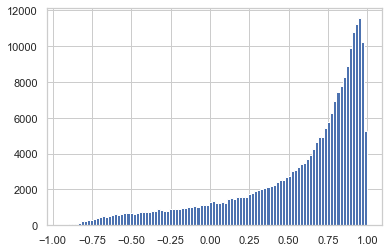

In [196]:
long_term = 77

df['market_correlation'] = df.groupby(level='symbol').apply(lambda df: df['vw'].rolling(window=long_term).corr(df['spy_value']))
df['market_st'] = df.groupby(level='symbol').apply(lambda df: df['vw'].rolling(window=long_term).corr(df['spy_value']))
df['market_correlation'] = df.groupby(level='symbol').apply(lambda df: df['vw'].rolling(window=long_term).corr(df['spy_value']))

In [187]:
def compute_alpha_beta(group, window_size=77):
    stock_returns = group['vw'].pct_change()
    SPY_returns = group['spy_value'].pct_change()
    
    rolling_cov = stock_returns.rolling(window=window_size).cov(SPY_returns)
    rolling_var = SPY_returns.rolling(window=window_size).var()
    
    beta = rolling_cov / rolling_var
    alpha = stock_returns - beta * SPY_returns
    
    return pd.DataFrame({'alpha': alpha, 'beta': beta})

# Group the dataset by symbol and apply the function to each group
alpha_beta = df.groupby(level='symbol').apply(compute_alpha_beta)

df[['alpha', 'beta']] = alpha_beta
#alpha_beta.groupby('symbol').get_group('AAPL').sort_values(by='beta')['beta'][100:-100].hist(bins=50)

alpha_beta

alpha  beta
t                   symbol             
2018-01-02 09:00:00 BABA      NaN   NaN
2018-01-02 10:00:00 BABA      NaN   NaN
2018-01-02 11:00:00 BABA      NaN   NaN
2018-01-02 12:00:00 BABA      NaN   NaN
2018-01-02 13:00:00 BABA      NaN   NaN
...                           ...   ...
2023-03-31 23:00:00 MSFT    0.000 0.719
                    NVDA    0.001 1.055
                    PFE     0.000 0.600
                    TSLA    0.001 0.962
                    XOM    -0.000 0.733

[254265 rows x 2 columns]

In [193]:
df.dropna().head()

,,o,h,l,c,v,n,vw,diff,s,emaS,...,ROA,Gross_Margin,Operating_Margin,Net_Profit_Margin,Current_Ratio,Debt_to_Equity,FCF,spy_value,alpha,beta
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-05 11:00:00,BABA,186.840,186.850,186.490,186.750,2390,15,186.767,1.002,0.004,1.001,...,0.034,0.578,0.313,0.290,1.966,0.370,"44,751,000,000.000",272.410,0.002,0.429
2018-01-05 12:00:00,BABA,186.450,186.660,186.390,186.640,19052,118,186.527,0.999,0.004,1.000,...,0.034,0.578,0.313,0.290,1.966,0.370,"44,751,000,000.000",272.455,-0.001,0.452
2018-01-05 13:00:00,BABA,186.600,186.910,186.100,186.720,94582,402,186.636,1.001,0.004,1.000,...,0.034,0.578,0.313,0.290,1.966,0.370,"44,751,000,000.000",272.521,0.000,0.443
2018-01-05 14:00:00,BABA,186.700,187.590,186.301,187.473,2508818,14950,186.912,1.001,0.004,1.001,...,0.034,0.578,0.313,0.290,1.966,0.370,"44,751,000,000.000",272.296,0.002,0.428
2018-01-05 15:00:00,BABA,187.470,188.880,187.470,188.520,3641473,24990,188.168,1.007,0.004,1.002,...,0.034,0.578,0.313,0.290,1.966,0.370,"44,751,000,000.000",272.175,0.007,0.331


In [146]:
df.reset_index().to_csv('final_dataset.csv')

In [57]:
df.groupby('symbol')

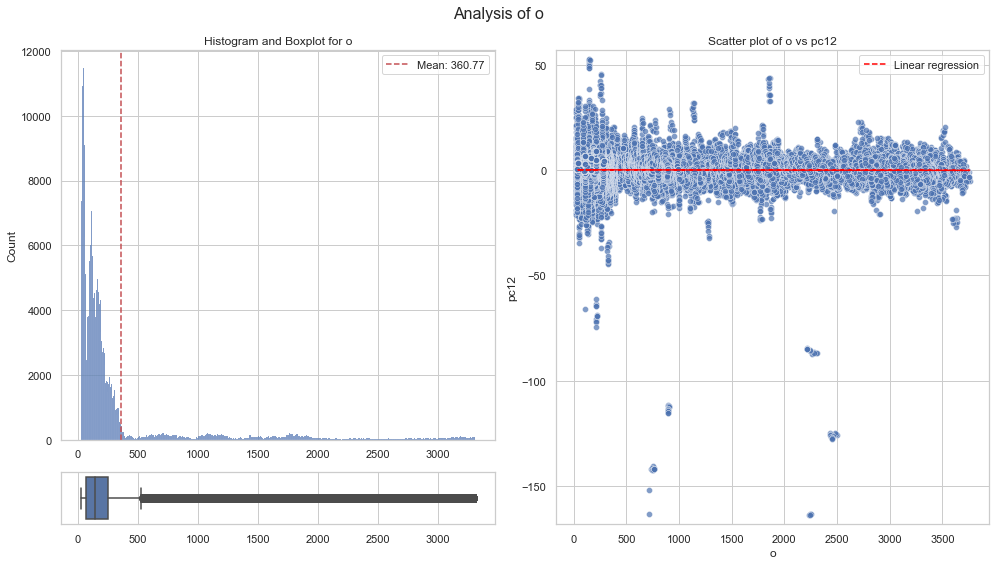

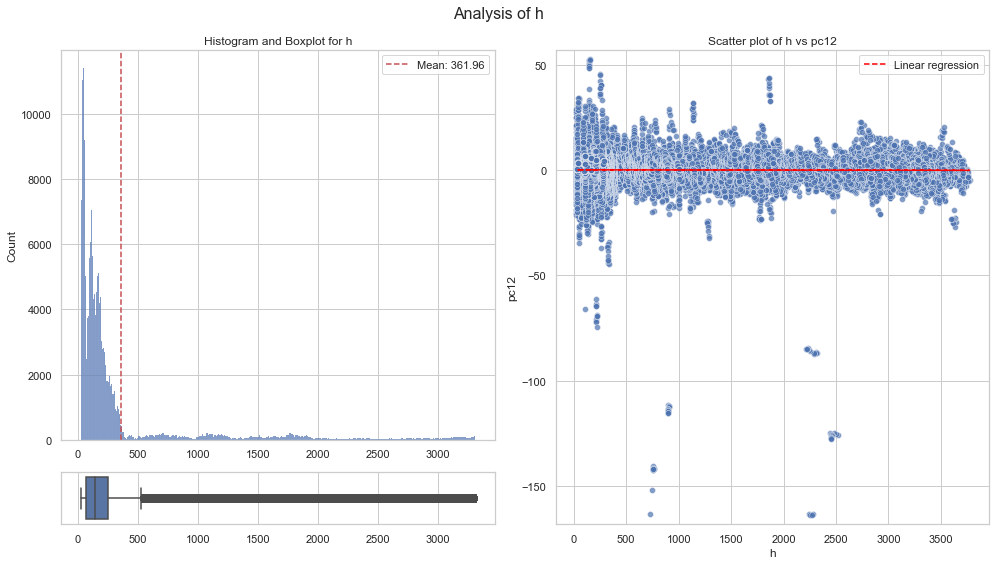

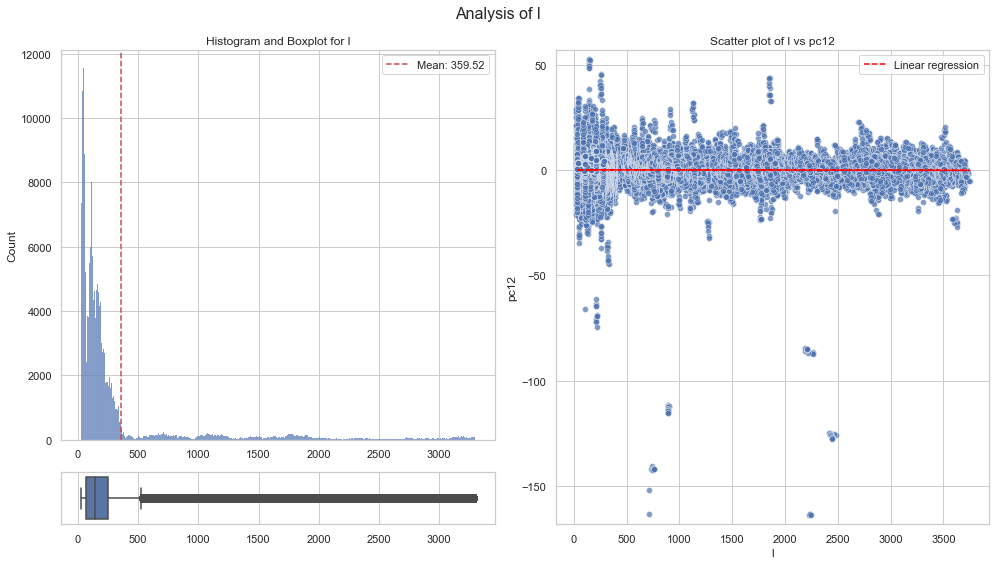

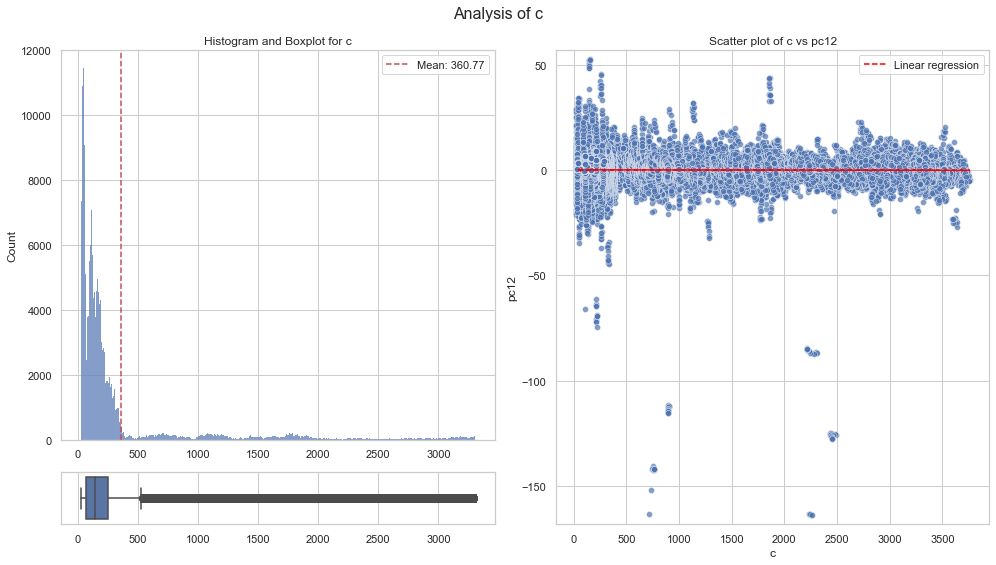

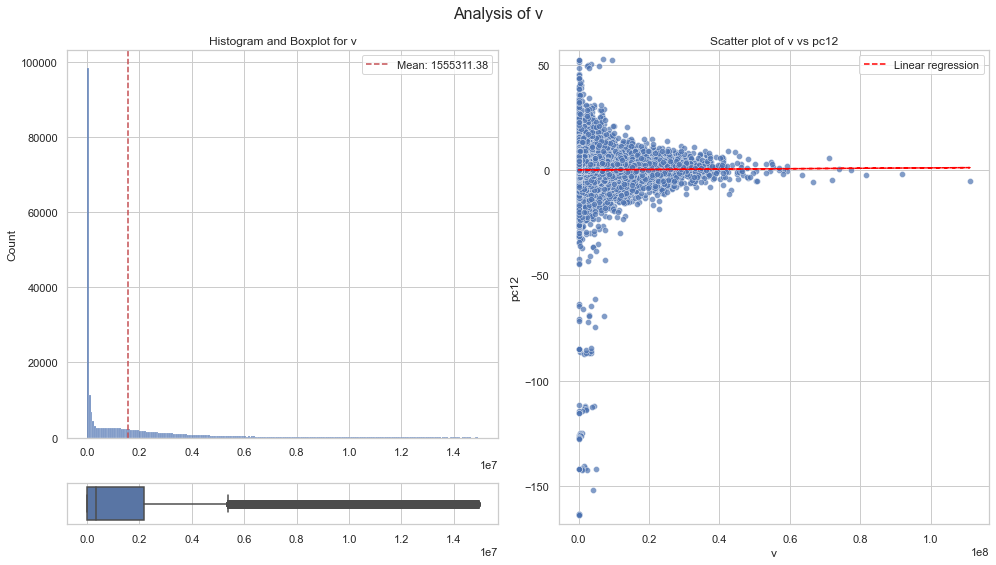

...

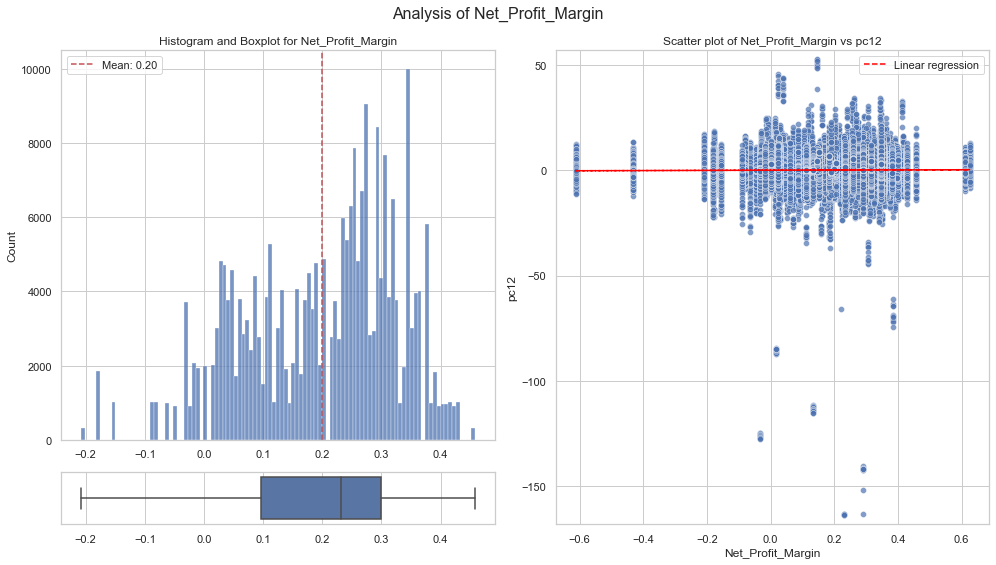

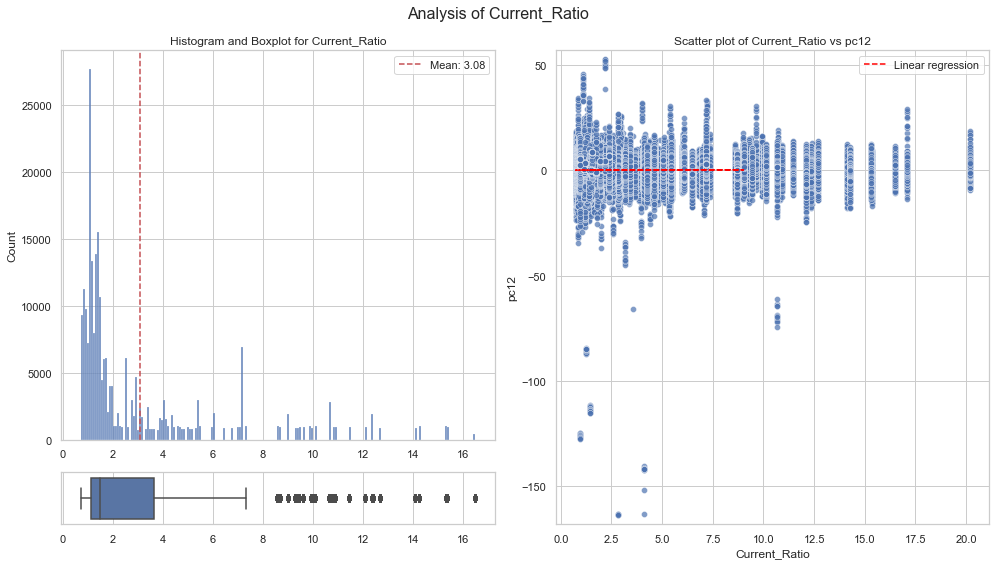

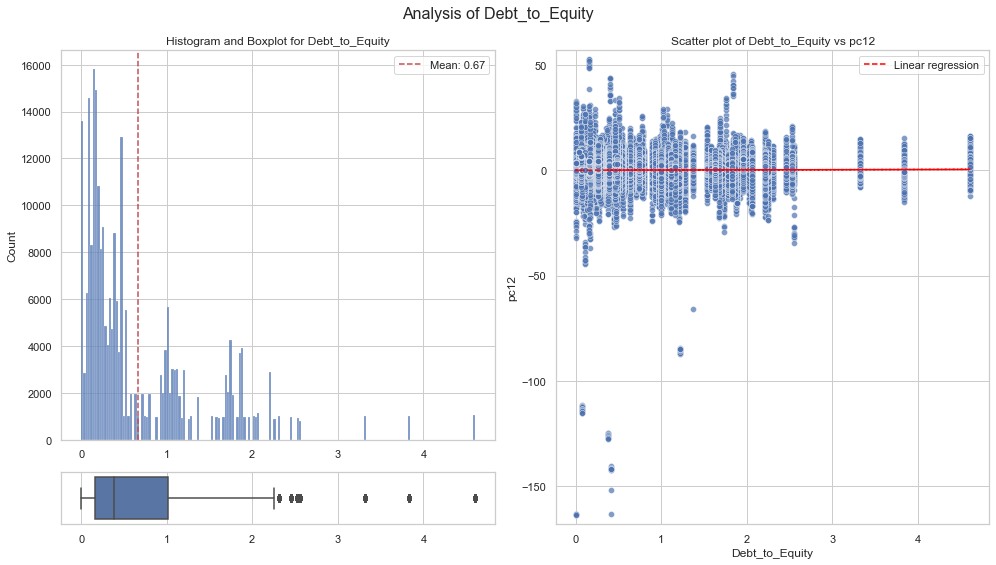

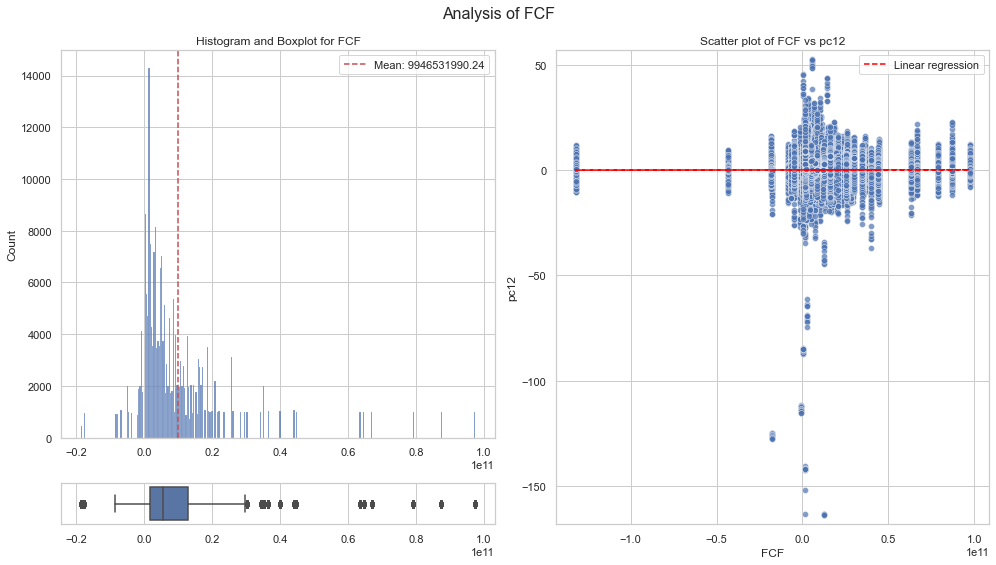

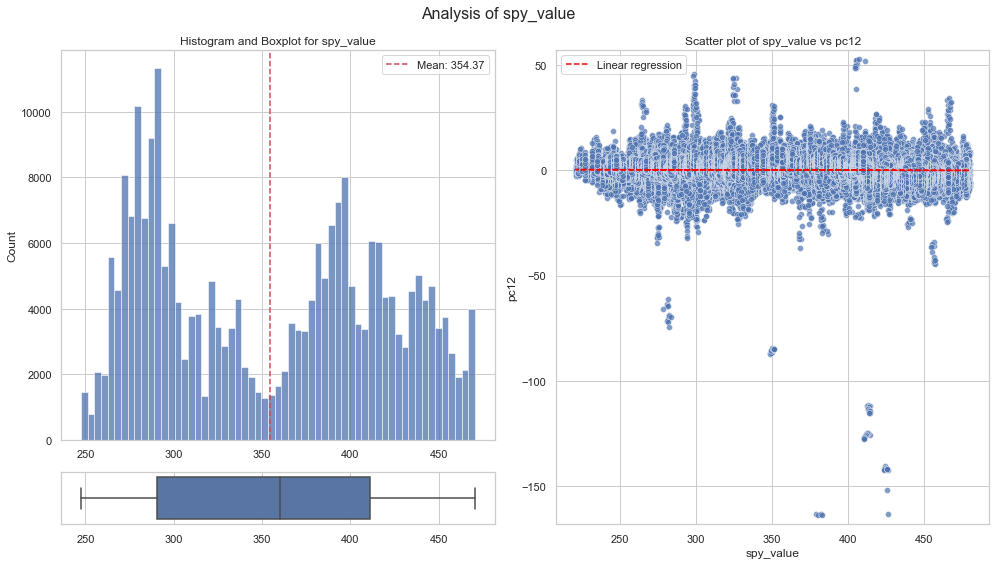

In [63]:
CustomPlotter.combined_plots(
    # df = df.groupby('symbol').get_group('AAPL').reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    df = df.reset_index().sort_values(by='pc12', ascending=True)[20:].set_index('t').sort_index(),
    columns = df.columns,
    target = 'pc12',
    outlier_drop_pct=1
)

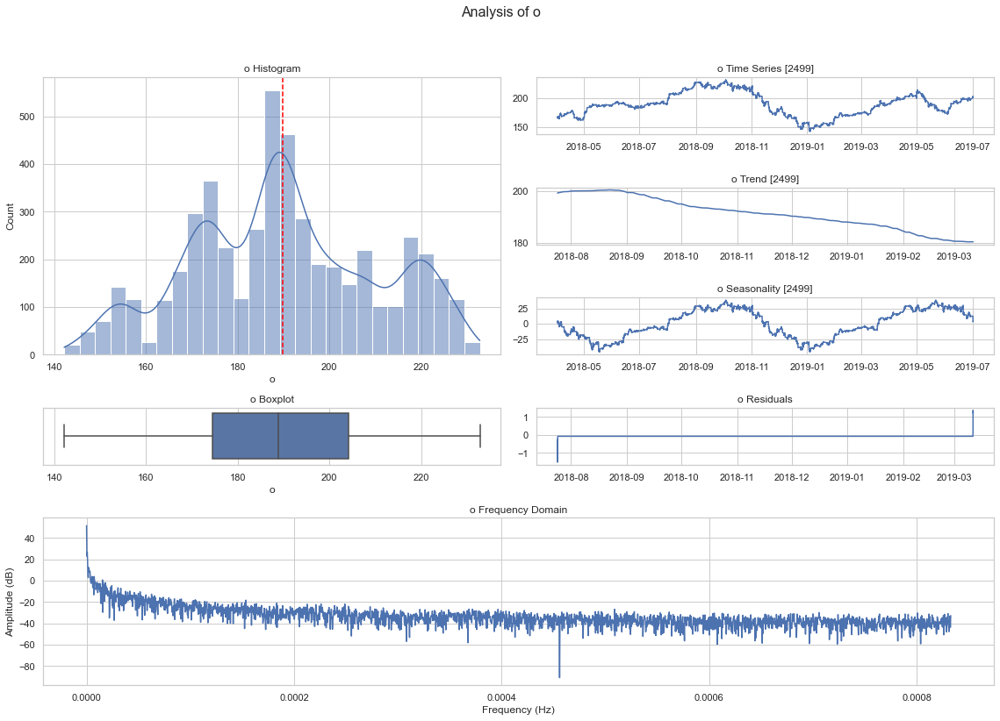

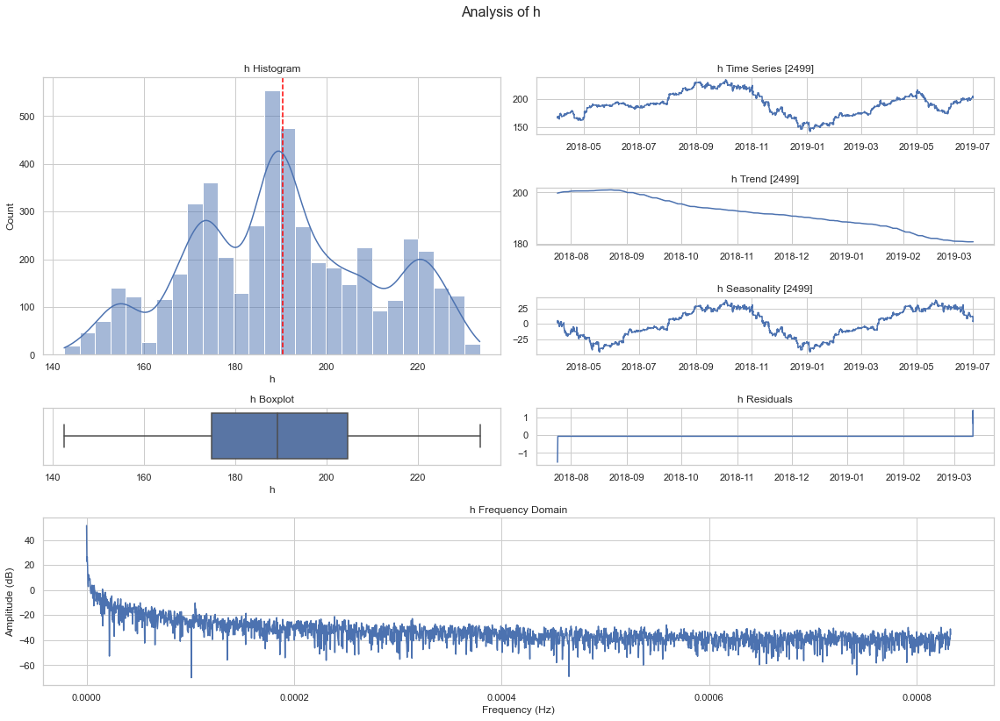

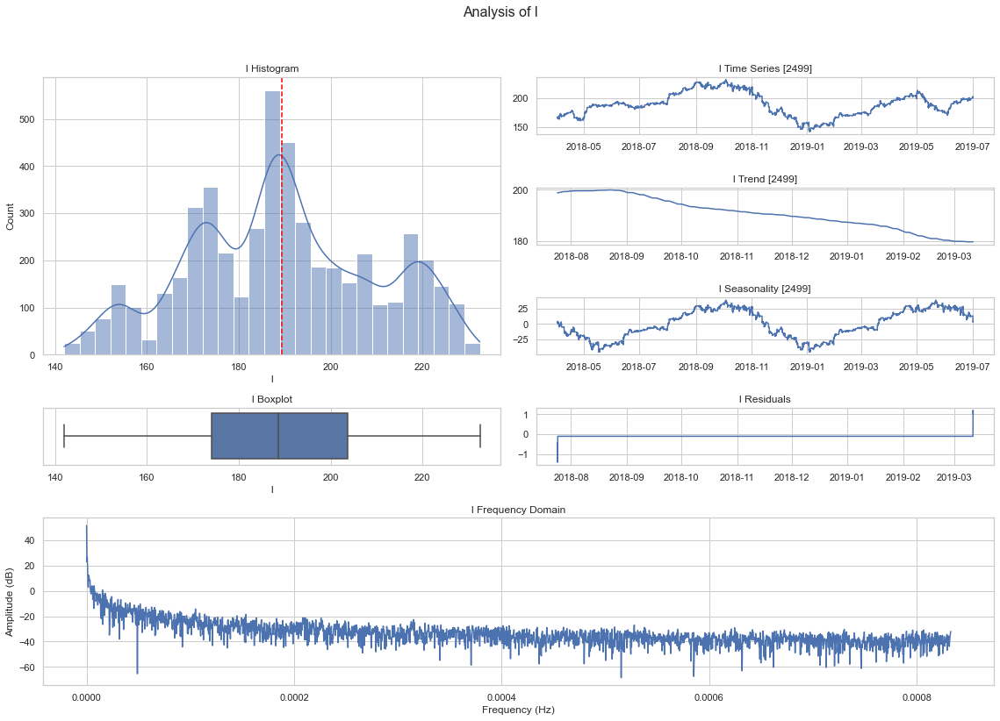

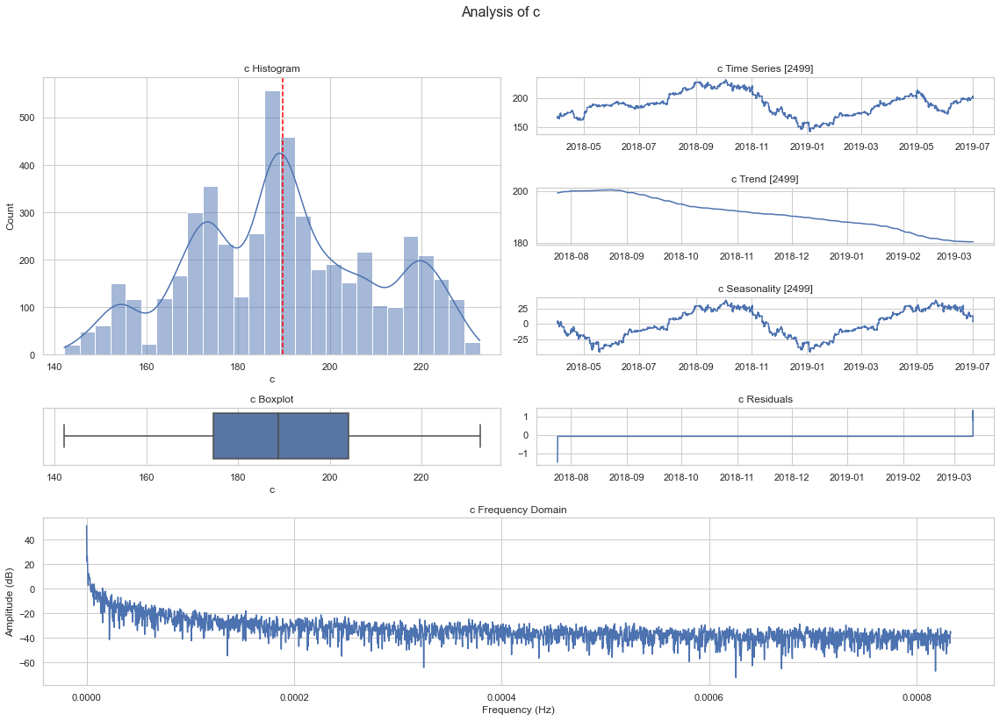

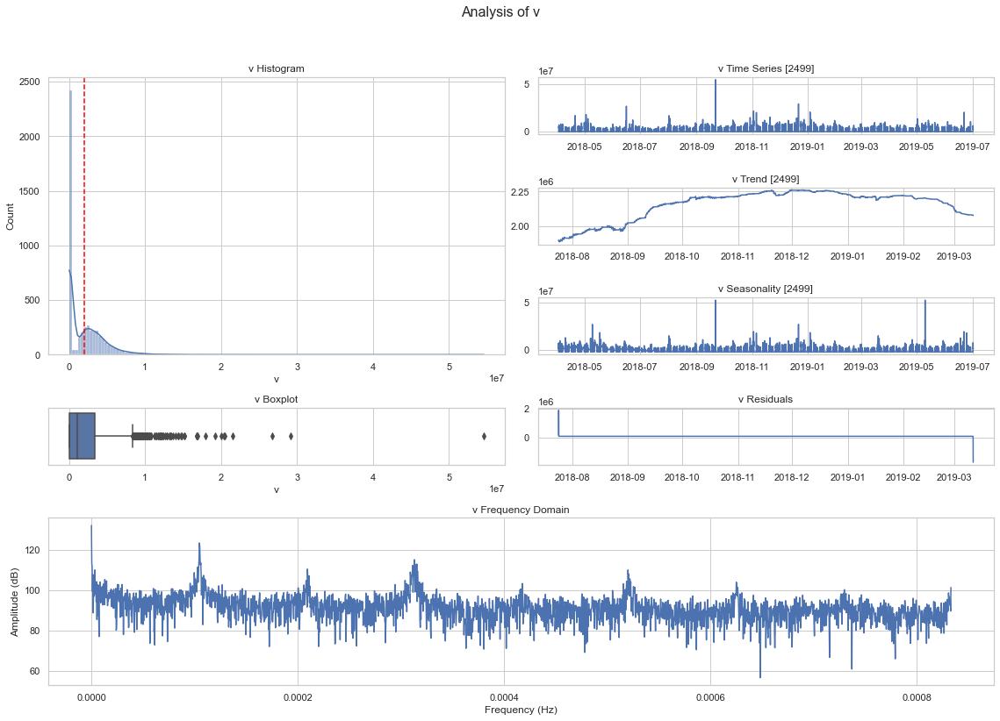

...

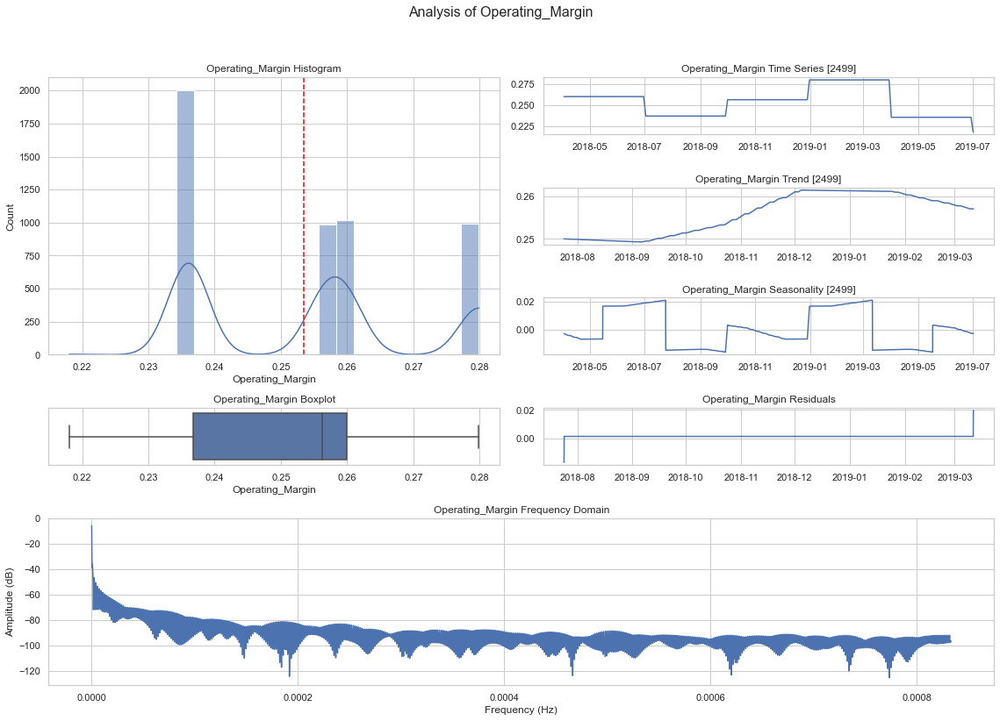

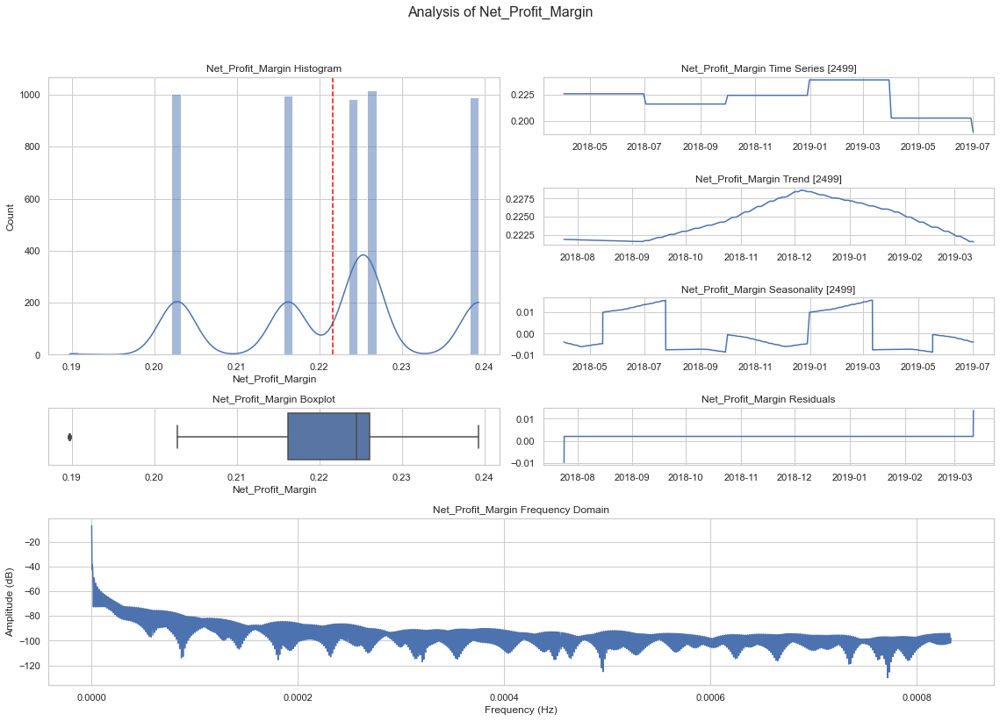

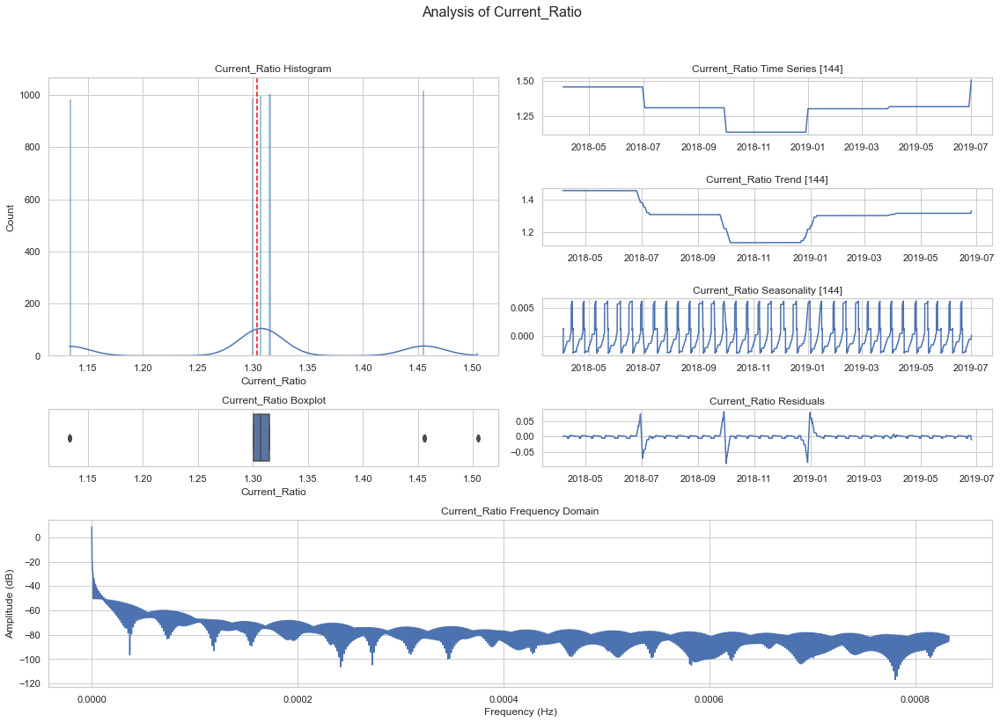

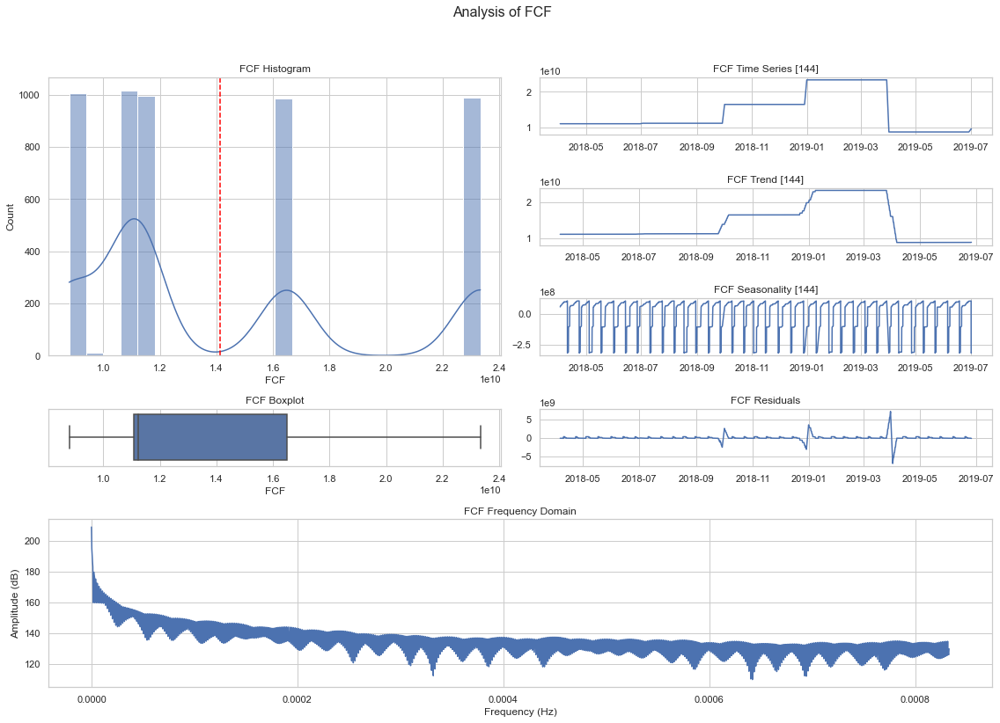

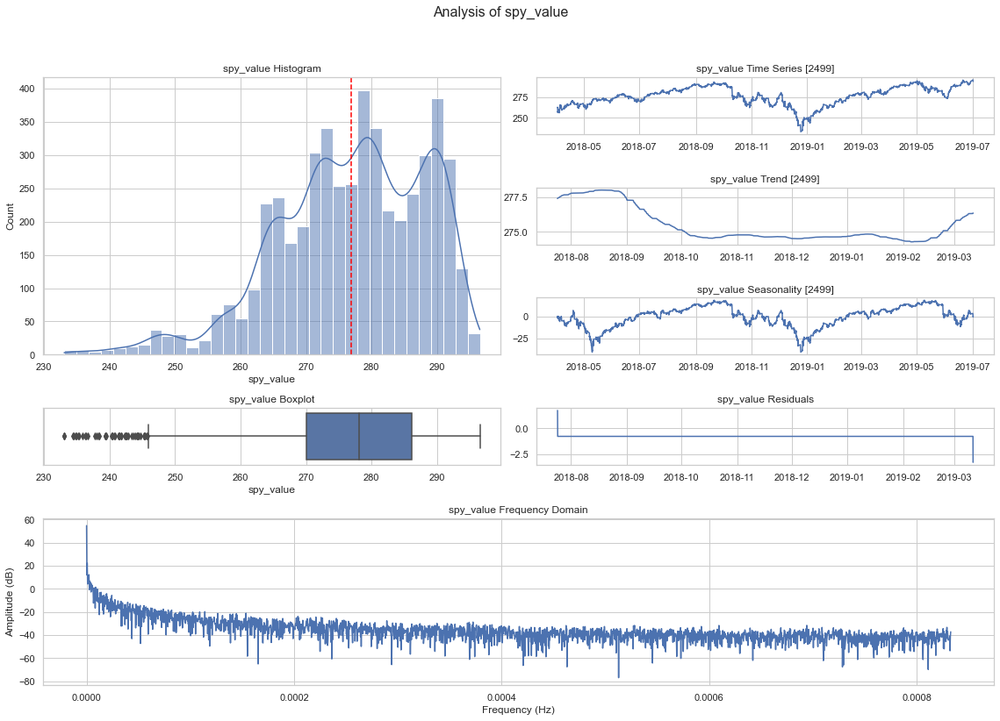

In [7]:
for col in df.columns:
    data = df.groupby('symbol').get_group('AAPL')
    data = data.reset_index()
    data = data.set_index(['t'])

    CustomPlotter.time_series_analysis(data[:5000], col)

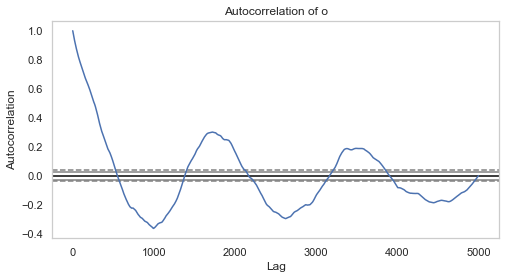

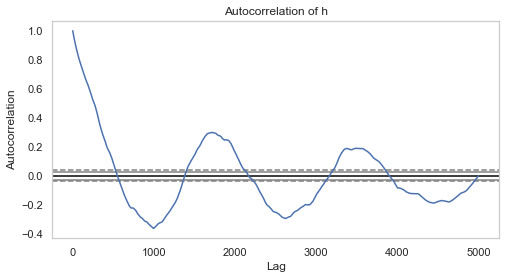

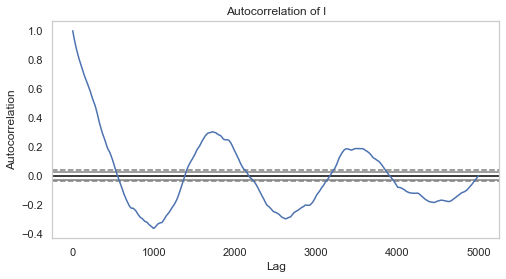

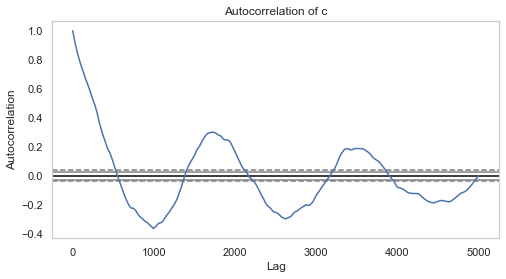

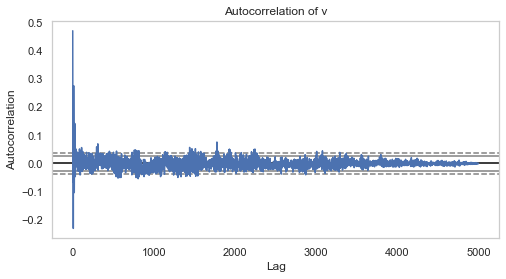

...

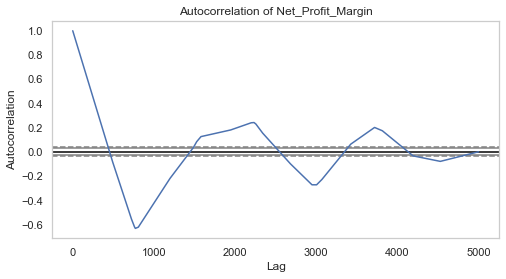

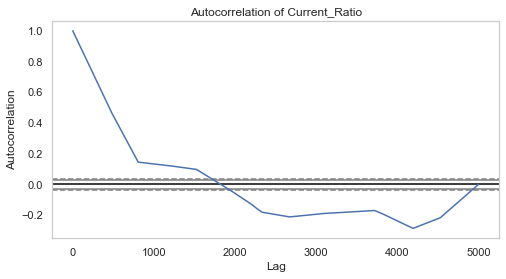

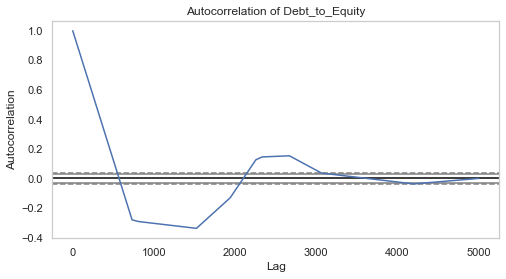

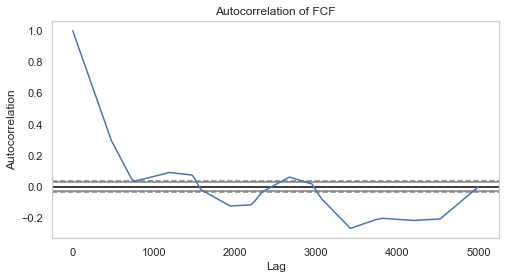

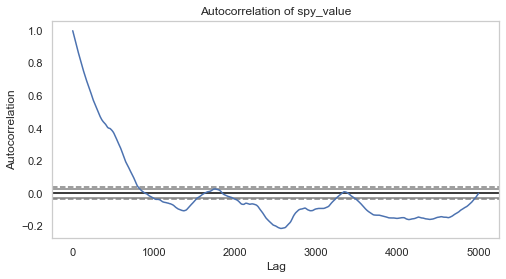

In [64]:
data = df.groupby('symbol').get_group('GOOG').reset_index().set_index(['t']).drop(columns=['symbol'])
CustomPlotter.autocorrelation_analysis(data[:5000])

---

In [72]:
data = df.drop(columns=['o', 'h', 'l', 'c', 'v', 'n', 'vw', 's12'])

In [73]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [84]:
def print_PCA_analysis(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target).dropna()
    columns = X_numeric.columns.tolist()

    # Standardize the data
    X_standardized = StandardScaler().fit_transform(X_numeric)

    # Perform PCA
    pca = PCA()
    pca.fit(X_standardized)
    X_pca = pca.transform(X_standardized)

    print("\nExplained variance:")
    for i, var in enumerate(pca.explained_variance_ratio_, 1):
        print("Comp. %d: %.2f%s [%.2f%s]" % (i, var * 100, '%', sum(pca.explained_variance_ratio_[:i]) * 100, '%'))
    #print(pca.explained_variance_ratio_)

    pca_weights = pd.DataFrame(pca.components_, columns=columns, index=[f'Comp. {i+1}' for i in range(pca.n_components_)]).T
    return pca.explained_variance_ratio_, pca_weights

In [85]:
pd.options.display.float_format = "{:,.3f}".format

explained_variance, pca_w = print_PCA_analysis(data, 'pc12')
pca_w


Explained variance:
Comp. 1: 17.01% [17.01%]
Comp. 2: 14.28% [31.29%]
Comp. 3: 10.98% [42.26%]
Comp. 4: 7.63% [49.89%]
Comp. 5: 6.23% [56.12%]
Comp. 6: 4.34% [60.46%]
Comp. 7: 4.03% [64.49%]
Comp. 8: 3.31% [67.79%]
Comp. 9: 3.03% [70.82%]
Comp. 10: 2.88% [73.70%]
Comp. 11: 2.77% [76.46%]
Comp. 12: 2.63% [79.09%]
Comp. 13: 2.51% [81.61%]
Comp. 14: 2.30% [83.90%]
Comp. 15: 1.94% [85.85%]
Comp. 16: 1.72% [87.57%]
Comp. 17: 1.55% [89.12%]
Comp. 18: 1.38% [90.50%]
Comp. 19: 1.19% [91.69%]
Comp. 20: 1.15% [92.83%]
Comp. 21: 1.00% [93.83%]
Comp. 22: 0.92% [94.75%]
Comp. 23: 0.80% [95.55%]
Comp. 24: 0.65% [96.20%]
Comp. 25: 0.63% [96.82%]
Comp. 26: 0.49% [97.32%]
Comp. 27: 0.45% [97.77%]
Comp. 28: 0.39% [98.16%]
Comp. 29: 0.37% [98.53%]
Comp. 30: 0.36% [98.89%]
Comp. 31: 0.30% [99.19%]
Comp. 32: 0.29% [99.47%]
Comp. 33: 0.15% [99.62%]
Comp. 34: 0.11% [99.73%]
Comp. 35: 0.09% [99.82%]
Comp. 36: 0.06% [99.88%]
Comp. 37: 0.05% [99.93%]
Comp. 38: 0.05% [99.98%]
Comp. 39: 0.01% [99.99%]
Comp. 40: 

,Comp. 1,Comp. 2,Comp. 3,Comp. 4,Comp. 5,Comp. 6,Comp. 7,Comp. 8,Comp. 9,Comp. 10,...,Comp. 37,Comp. 38,Comp. 39,Comp. 40,Comp. 41,Comp. 42,Comp. 43,Comp. 44,Comp. 45,Comp. 46
diff,-0.006,-0.010,-0.143,-0.183,-0.249,0.050,-0.121,0.147,0.003,-0.392,...,0.029,-0.082,-0.001,-0.001,0.002,0.004,0.000,0.000,0.000,-0.000
s,0.096,0.116,0.244,-0.226,-0.114,-0.129,0.220,-0.072,0.115,0.106,...,0.102,-0.077,0.002,-0.002,0.000,-0.002,0.000,-0.000,0.000,0.000
emaS,-0.016,-0.024,-0.294,-0.245,-0.211,-0.009,-0.007,-0.036,-0.029,0.020,...,-0.083,0.300,0.004,0.001,-0.003,0.005,0.000,0.000,-0.000,0.000
emaM,-0.025,-0.037,-0.373,-0.118,0.108,-0.088,0.126,-0.081,0.086,0.024,...,-0.022,-0.273,-0.003,-0.007,-0.000,-0.001,-0.000,-0.000,0.000,0.000
emaL,-0.021,-0.042,-0.350,0.001,0.218,-0.040,0.073,0.095,0.257,-0.112,...,0.646,0.303,0.003,0.019,0.003,-0.000,-0.000,-0.000,-0.000,0.000
ema12L,-0.020,-0.040,-0.346,-0.005,0.212,-0.040,0.071,0.099,0.259,-0.114,...,-0.566,-0.199,-0.000,0.002,-0.001,0.000,-0.000,0.000,-0.000,-0.000
std,0.120,0.133,0.168,-0.277,-0.001,-0.227,0.212,-0.045,0.009,-0.011,...,-0.033,0.071,0.010,0.003,-0.000,0.001,-0.000,0.000,-0.000,-0.000
pc,-0.004,-0.007,-0.117,-0.188,-0.282,0.062,-0.135,0.148,-0.024,-0.357,...,0.001,0.006,-0.000,0.001,-0.002,-0.003,0.000,-0.000,-0.000,-0.000
mvS,-0.061,0.237,0.041,-0.176,0.134,-0.160,-0.304,0.041,0.054,0.158,...,-0.021,-0.004,0.145,-0.002,0.000,-0.000,0.002,0.055,0.008,-0.658
mvL,-0.117,0.298,0.031,-0.180,0.104,-0.038,-0.000,-0.139,0.030,-0.105,...,0.004,-0.008,-0.177,-0.002,-0.000,0.000,-0.608,0.032,-0.015,0.003


In [89]:
pca_weights_scaled = pca_w * explained_variance
pca_weights_scaled.T.abs().sum().sort_values(ascending=False)

s                    0.131
Net_Profit_Margin    0.129
macd_std             0.125
lavs                 0.124
std                  0.121
P/S                  0.120
ROE                  0.119
Current_Ratio        0.118
mnS                  0.117
mvS                  0.117
Operating_Margin     0.117
ROA                  0.116
Gross_Margin         0.114
mvL                  0.114
spy_value            0.111
obvmL                0.110
obv                  0.109
P/B                  0.109
obvmS                0.109
ewm_12               0.109
ewm_26               0.109
macd                 0.109
mnL                  0.108
obvsL                0.107
signal               0.107
rlmS                 0.105
P/E                  0.105
rsid                 0.102
macds                0.102
lavgv                0.101
pc                   0.101
diff                 0.100
Debt_to_Equity       0.100
emaM                 0.099
FCF                  0.099
ema12L               0.099
rsi                  0.098
f

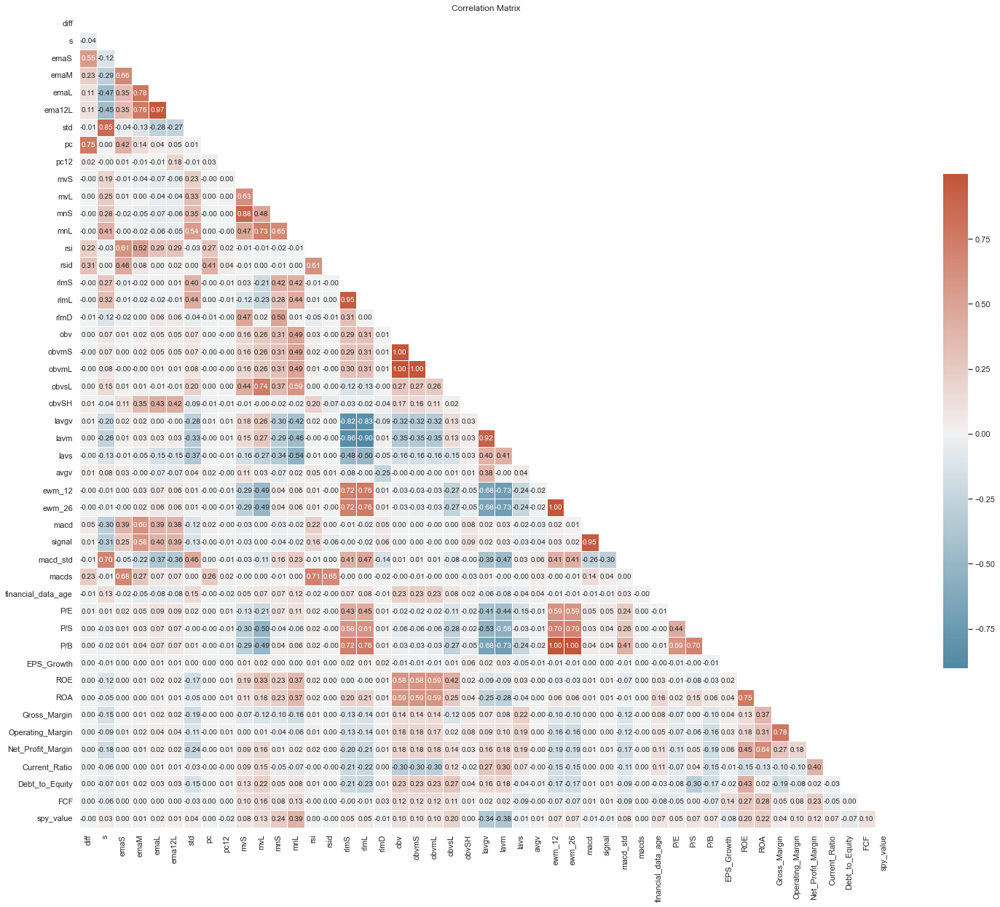

In [105]:
CustomPlotter.plot_corrmatrix(data, figsize=(25, 25))

In [110]:
data.isna().sum()

diff                      0
s                         0
emaS                      0
emaM                      0
emaL                      0
ema12L                    0
std                       0
pc                        0
pc12                      0
mvS                       0
mvL                       0
mnS                       0
mnL                       0
rsi                       0
rsid                      0
rlmS                      0
rlmL                      0
rlmD                      0
obv                       0
obvmS                     0
obvmL                     0
obvsL                     0
obvSH                     0
lavgv                     0
lavm                      0
lavs                      0
avgv                      0
ewm_12                    0
ewm_26                    0
macd                      0
signal                    0
macd_std                  0
macds                     0
financial_data_age        0
P/E                       0
P/S                 

In [111]:
def compute_ig(df, target):
    X_numeric = df.select_dtypes(include=[np.number]).drop(columns=target)
    y = df[target]

    mi_scores = mutual_info_regression(X_numeric, y)
    mi_scores = pd.Series(mi_scores, name="MI_Scores", index=X_numeric.columns)
    mi_scores = mi_scores.sort_values(ascending=False)

    print("\nInformation Gain:")
    print(mi_scores)

compute_ig(data.dropna(), 'pc12')


Information Gain:
financial_data_age   0.053
obvmL                0.046
obvmS                0.040
ema12L               0.038
P/E                  0.038
obv                  0.038
macd_std             0.037
spy_value            0.036
Net_Profit_Margin    0.036
ROE                  0.035
ROA                  0.035
P/S                  0.034
s                    0.034
std                  0.033
Gross_Margin         0.033
ewm_26               0.033
lavm                 0.032
Operating_Margin     0.031
FCF                  0.031
ewm_12               0.031
rlmL                 0.030
obvsL                0.030
P/B                  0.030
Current_Ratio        0.029
Debt_to_Equity       0.027
lavs                 0.021
emaL                 0.020
EPS_Growth           0.014
emaM                 0.012
mnL                  0.011
obvSH                0.011
mvL                  0.009
signal               0.008
macd                 0.007
lavgv                0.006
rlmD                 0.006
macds    

---

In [157]:
def get_cluster_dataset(fit_data: pd.DataFrame, target_df: pd.DataFrame, include_price=True):
    
    rows_selection = [
        'financial_data_age', 'obvmL', 'obvmS', 'ema12L', 'P/E', 'obv', 'macd_std', 'spy_value',
        'Net_Profit_Margin', 'ROE', 'ROA', 'P/S', 's', 'std', 'Gross_Margin'
    ]
    if include_price: rows_selection.append('price')
    
    rows_selection = target_df.columns
    fit_cluster_data = fit_data[rows_selection]
    target_cluster_df = target_df[rows_selection]
    
    num_cols = fit_cluster_data.select_dtypes(include=[np.number]).columns
    cluster_scaler = StandardScaler().fit(fit_cluster_data[num_cols])
    fit_cluster_data[num_cols] = pd.DataFrame(cluster_scaler.transform(fit_cluster_data[num_cols]), columns=num_cols, index=fit_cluster_data.index)
    target_cluster_df[num_cols] = pd.DataFrame(cluster_scaler.transform(target_cluster_df[num_cols]), columns=num_cols, index=target_cluster_df.index)

    return target_cluster_df

In [148]:
def cluster_analysis(data, labels):
    df = pd.DataFrame({'id': labels})

    noise_instances = (df['id'] == -1).sum()
    total_instances = len(data)
    noise_proportion = noise_instances / total_instances

    # Calculate cluster size statistics
    if -1 in df['id'].value_counts():
        cluster_sizes = df['id'].value_counts().drop(-1)  # Remove the noise cluster
    else:
        cluster_sizes = df['id'].value_counts()
    
    mean_cluster_size = cluster_sizes.mean()
    sd_cluster_size = cluster_sizes.std()
    min_cluster_size = cluster_sizes.min()
    max_cluster_size = cluster_sizes.max()

    # Print the results
    print(f"   -> Number of clusters: {len(set(labels))}")
    print(f"   -> Number of noise instances: {noise_instances} [{(noise_proportion*100):.2f}%]")
    print(f"   -> Mean cluster size: {mean_cluster_size:.2f}")
    print(f"   -> Standard deviation of cluster size: {sd_cluster_size:.2f}")
    print(f"   -> Minimum cluster size: {min_cluster_size}")
    print(f"   -> Maximum cluster size: {max_cluster_size}")

In [149]:
from itertools import product

def find_best_clustering(X, min_samples_values, xi_values):
    best_score = -1
    best_params = None
    best_model = None

    # Generate all possible combinations of hyperparameters
    param_combinations = list(product(min_samples_values, xi_values))

    for min_samples, xi in param_combinations:
        print("#"*50)
        print(f"Testing ms: {min_samples} - xi: {xi}")

        # Initialize and fit the OPTICS model with the current combination of hyperparameters
        model = OPTICS(min_samples=min_samples, xi=xi)
        model.fit(X)

        labels = model.labels_
        cluster_analysis(X, labels)

        # Get the indices of the samples in X that have a valid cluster label
        valid_sample_indices = np.where(labels != -1)

        # Extract the samples with valid cluster labels and their corresponding labels
        X_valid = X.iloc[valid_sample_indices]
        labels_valid = labels[valid_sample_indices]

        if len(np.unique(labels_valid)) > 1:
            # Calculate the silhouette score for the current model
            score = silhouette_score(X_valid, labels_valid)

            print(f" -> Silhoulette Score: {score:.2f}")

            # Update the best score, best parameters, and best model if the current score is better
            if score > best_score:
                print(" -> New best score!")
                best_score = score
                best_params = {'min_samples': min_samples, 'xi': xi}
                best_model = model

    return best_score, best_params, best_model

In [158]:
cluster_data = get_cluster_dataset(data, data)
cluster_data.head()

,,diff,s,emaS,emaM,emaL,ema12L,std,pc,pc12,mvS,...,EPS_Growth,ROE,ROA,Gross_Margin,Operating_Margin,Net_Profit_Margin,Current_Ratio,Debt_to_Equity,FCF,spy_value
t,symbol,,,,,,,,,,,,,,,,,,,,,
2018-01-02 09:00:00,BABA,0.714,-0.346,0.393,0.050,-0.190,0.282,-0.375,1.327,3.200,-0.791,...,15.596,0.015,0.374,0.304,0.264,0.626,-0.354,-0.397,2.004,-1.333
2018-01-02 10:00:00,BABA,0.346,-0.348,0.509,0.122,-0.153,0.352,-0.379,0.653,3.144,-0.990,...,15.596,0.015,0.374,0.304,0.264,0.626,-0.354,-0.397,2.004,-1.332
2018-01-02 11:00:00,BABA,0.368,-0.349,0.617,0.197,-0.113,0.419,-0.383,0.690,3.059,-1.124,...,15.596,0.015,0.374,0.304,0.264,0.626,-0.354,-0.397,2.004,-1.329
2018-01-02 12:00:00,BABA,0.210,-0.351,0.625,0.237,-0.091,0.485,-0.388,0.399,3.020,-1.026,...,15.596,0.015,0.374,0.304,0.264,0.626,-0.354,-0.397,2.004,-1.325
2018-01-02 13:00:00,BABA,0.271,-0.353,0.663,0.289,-0.062,0.550,-0.393,0.510,3.005,-0.890,...,15.596,0.015,0.374,0.304,0.264,0.626,-0.354,-0.397,2.004,-1.323


In [135]:
# Define the range of hyperparameter values to search through
min_samples_values = [5, 25, 50, 100, 200, 500]
xi_values = [0.000001]

# Find the best clustering model
best_score, best_params, best_model = find_best_clustering(
    cluster_data[cluster_data.index.get_level_values('symbol') == 'AAPL'].dropna(),
    [5, 25, 50, 100, 200, 500],
    [0.0000001]
)

print(f"Best Silhouette Score: {best_score}")
print(f"Best Parameters: {best_params}")

##################################################
Testing ms: 5 - xi: 1e-07
   -> Number of clusters: 992
   -> Number of noise instances: 11555 [4.54%]
   -> Mean cluster size: 7.88
   -> Standard deviation of cluster size: 3.43
   -> Minimum cluster size: 5
   -> Maximum cluster size: 27
 -> Silhoulette Score: 0.28
 -> New best score!
##################################################
Testing ms: 25 - xi: 1e-07
   -> Number of clusters: 64
   -> Number of noise instances: 15321 [6.03%]
   -> Mean cluster size: 64.21
   -> Standard deviation of cluster size: 77.02
   -> Minimum cluster size: 26
   -> Maximum cluster size: 583
 -> Silhoulette Score: 0.20
##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 25
   -> Number of noise instances: 12401 [4.88%]
   -> Mean cluster size: 290.21
   -> Standard deviation of cluster size: 396.54
   -> Minimum cluster size: 51
   -> Maximum cluster size: 1517
 -> Silhoulette Score: 0.15
#########

In [159]:
best_score, best_params, best_model = find_best_clustering(
    cluster_data.sample(int(len(cluster_data) * 0.10)).dropna(),
    [50],
    [0.0000001]
)

##################################################
Testing ms: 50 - xi: 1e-07
   -> Number of clusters: 39
   -> Number of noise instances: 14230 [66.00%]
   -> Mean cluster size: 192.89
   -> Standard deviation of cluster size: 185.15
   -> Minimum cluster size: 51
   -> Maximum cluster size: 779
 -> Silhoulette Score: 0.23
 -> New best score!


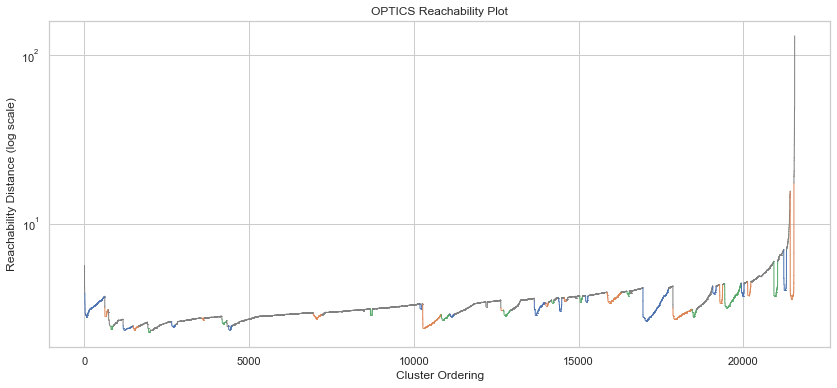

In [160]:
# Extract reachability distances, cluster ordering, and labels
reachability = best_model.reachability_[best_model.ordering_]
cluster_ordering = np.arange(len(reachability))
labels = best_model.labels_[best_model.ordering_]

# Assign colors based on cluster labels
colors = np.where(labels == -1, 'gray', None)
unique_clusters = np.unique(labels[labels != -1])

for i, cluster in enumerate(unique_clusters):
    colors[labels == cluster] = ['C0', 'C1', 'C2'][i % 3]

sn.set_style('whitegrid')

# Create the plot
fig, ax = plt.subplots(figsize=(14, 6))

# Plot each segment of the line with its corresponding color
for i in range(1, len(reachability)):
    ax.plot(cluster_ordering[i-1:i+1], reachability[i-1:i+1], lw=1, color=colors[i-1])

# Set the y-axis to logarithmic scale
ax.set_yscale('log')

plt.title('OPTICS Reachability Plot')
plt.xlabel('Cluster Ordering')
plt.ylabel('Reachability Distance (log scale)')

plt.show()


---